# Mapping with Geopandas

Mapping is a GIS specialization unto itself, but in this reading I want to provide a really quick intro to some of the tools available for mapping data with geopandas.

## plot()

As we saw in our previous readings, the `.plot()` command is an easy way to create maps in geopandas. Just running `.plot()` will result in geopandas visualizing our data:

<Axes: >

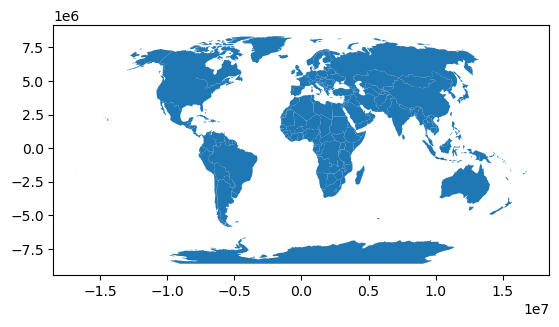

In [1]:
import geopandas as gpd

world = gpd.read_file(
    "https://github.com/nickeubank/practicaldatascience_book/"
    "raw/refs/heads/main/notebooks/"
    "gis/example_data/world_countries/world_countries_robinson.geojson"
)

# Plot!
world.plot()


Moreover, as we saw in our [intro reading](gis_what_is_it.ipynb), if you pass `.plot()` a column name, geopandas will color each observation based on the value of that variable to create something called a [choropleth map](https://en.wikipedia.org/wiki/Choropleth_map):

<Axes: >

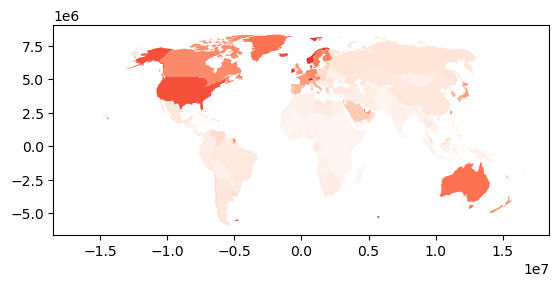

In [2]:
world["gdp_per_cap"] = world["gdp_md"] / world["pop_est"]
world = world[world["name"] != "Antarctica"].copy()
world.plot("gdp_per_cap", cmap="Reds")

 (Note the geopandas `.plot()` method also accepts all the usual arguments you might pass to matplotlib, like `cmap`, which controls the colors used in the plot).

## Native Interactive Maps

But perhaps the coolest mapping trick that is provided by geopandas is the ability to create interactive maps just using the `.explore()` method!

In [3]:
world.explore()

Which can also be combined with lots of options:

In [4]:
world.explore(
    column="pop_est",
    scheme="naturalbreaks",  # use mapclassify's natural breaks scheme
    legend=False,  # show legend
    k=10,  # use 10 bins
    name="countries",  # name of the layer in the map
    cmap="Reds",
)

And of course you can also layer maps on top of one another:

In [5]:
cities = gpd.read_file(
    "https://github.com/nickeubank/practicaldatascience_book/raw"
    "/refs/heads/main/notebooks/gis/example_data/world_cities/world_cities_robinson.geojson"
)

In [6]:
import folium

# Assign map object to m
m = world.explore(
    column="pop_est",
    scheme="naturalbreaks",
    legend=False,
    k=10,
    name="countries",
    cmap="Reds",
)

cities.explore(
    m=m,  # pass map you want to add to here.
    color="red",  # use red color on all points
    marker_kwds=dict(radius=5, fill=True),  # make marker radius 10px with fill
    tooltip="pop_max",  # show "name" column in the tooltip
    tooltip_kwds=dict(labels=False),  # do not show column label in the tooltip
    name="Cities",  # name of the layer in the map
)

To learn more, [you can read the full docs here!](https://geopandas.org/en/stable/docs/user_guide/interactive_mapping.html) and/or try it yourself!